In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.99 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


In [ ]:
!curl -L "https://app.roboflow.com/ds/YCsKLvAbzh?key=wauxyPlLFl" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1323      0 --:--:-- --:--:-- --:--:--  1323
100 67.7M  100 67.7M    0     0  13.1M      0  0:00:05  0:00:05 --:--:-- 15.2M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: train/
   creating: train/images/
 extracting: train/images/train_BLA_0001_JPG.rf.6dfdc831a8d4eeccb161f8ec4135cb5c.jpg  
 extracting: train/images/train_BLA_0003_JPG.rf.c69e21b8092edf615d65223dce972852.jpg  
 extracting: train/images/train_BLA_0004_JPG.rf.50b023488b13e33cb0ad8a592ae8631d.jpg  
 extracting: train/images/train_BLA_0005_JPG.rf.eba3b36853391b05129bca52bf72e864.jpg  
 extracting: train/images/train_BLA_0007_JPG.rf.0593c71b90ae833c61c91eecf2a5cdca.jpg  
 extracting: train/images/train_BLA_0008_JPG.rf.a3adf62e4d2bc6979376b184f4231f95.jpg  
 extracting: tra

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['human']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8l.yaml')  # build a new model from scratch
# model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)

# Use the model
results = model.train(data='data.yaml', epochs=15)  # train the model
results = model.val()  # evaluate model performance on the validation set
results = model('/content/train/images/train_BLA_0008_JPG.rf.a3adf62e4d2bc6979376b184f4231f95.jpg')  # predict on an image
# success = model.export(format='onnx')  # export the model to ONNX format


                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512

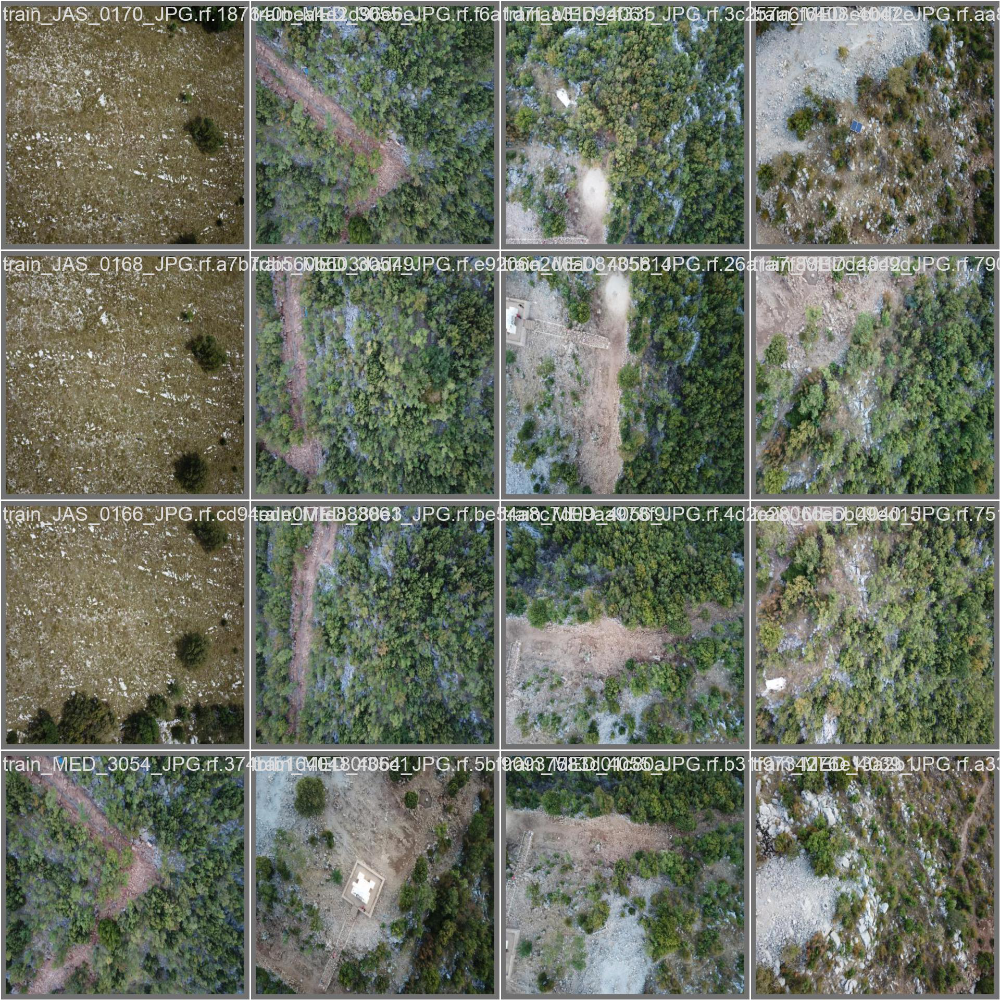

In [ ]:
from PIL import Image

# Open the image
image = Image.open('/content/runs/detect/train2/val_batch2_pred.jpg')
# Show the image
image.show()

## метрики для модели обученной с нуля
- Precision: 0
- Recall: 0
- mAP50: 0
- mAP50-95: 0
- FPS: 96

## Метрики для предобученой

In [ ]:
# Дообучим модель 
!yolo train model=yolov8n.pt data=data.yaml epochs=50 imgsz=640

Ultralytics YOLOv8.0.96 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=None, workspace=4

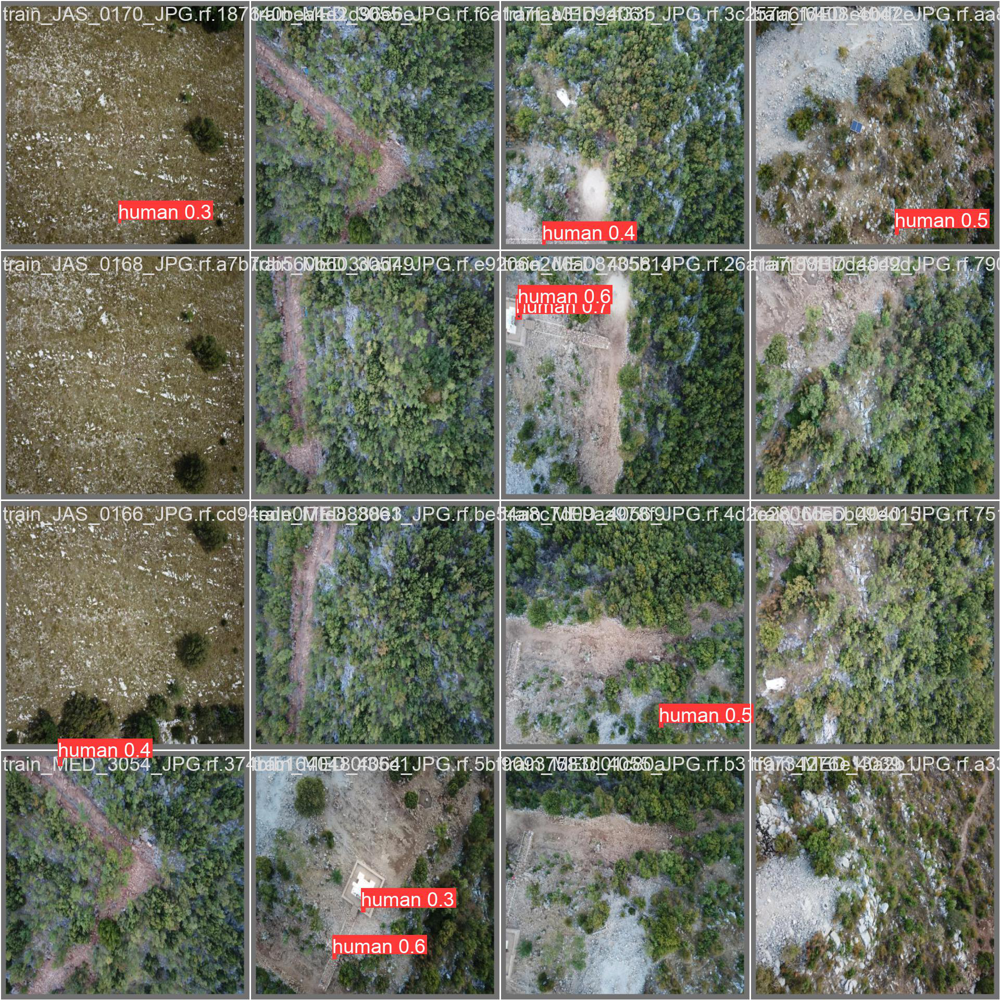

In [ ]:
from PIL import Image

# Open the image
image = Image.open('/content/runs/detect/train2/val_batch2_pred.jpg')
# Show the image
image.show()

## метрики для предобученной модели
- Precision: 0.636
- Recall: 0.502
- mAP50: 0.549
- mAP50-95: 0.211
- FPS: 142.86

  

Была использована модель Yolo_v_8_n предобученная